# 3 Community Detection
The following section will divide the network into partitions based on different methods and visualize the biggest communities with wordclouds. 

This notebook includes:
1. Setting up the network 
2. Community detection based on the Louvain algorithm
3. Community detection based on manual partitions into series and category
4. Community detection based on overlapping partitons with the percolation method
5. Main findings

## 3.1 Setting up the network

Import packages

In [ ]:
# Import packages
!pip install networkx
!pip install community
!pip install python-louvain
!pip install wordcloud

In [ ]:
# import packages
import networkx as nx
from networkx.algorithms.community import k_clique_communities
import community.community_louvain as community_louvain
from collections import defaultdict
import matplotlib.pyplot as plt
import nltk
from pathlib import Path  
import glob
import os
import re
import json
import pandas as pd
from wordcloud import WordCloud 
import sklearn
from sklearn import preprocessing
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

Create network

In [ ]:
df = pd.read_csv("data/characters.csv")

In [ ]:
df['outlinks_clean'] = ""
df['outlinks_clean'] = df['outlinks_clean'].astype('object')
df['character_links'] = ""
df['character_links']  = df['character_links'] .astype('object')

for index, row in df.iterrows():
    title = row['file']
    pageid = str(row['pageid'])
    
    f = open("data/character wikipages/" + title + ".json")
    data = json.load(f)
    text = json.dumps(data)
    
    
    res = re.findall(r"\[\[.*?\]\]", text)
    res_clean = []
    for element in res:
        element = element.strip("[[").strip("]]")
        res_clean.append(element)
    
    df.at[index, 'outlinks_clean'] = res_clean
        
    links_clean = []
    for element in res_clean:
        element = element.split("|")[0]
        if element in df.title.tolist():
            links_clean.append(element)
    
    single_links = list(set(links_clean))
        
    df.at[index, 'character_links'] = single_links

In [ ]:
def set_up_network(net, character, universe_c, universe_encoded):
    # add nodes for the character with the attribute which universe 
    net.add_node(character, universe=universe_c, universe_enc = universe_encoded)
    
def add_links_to_network(net, character, links_clean):
    for link in links_clean:
        net.add_edge(character, link)

In [ ]:
ga_net = nx.DiGraph()
for index, row in df.iterrows():
    name = row['title']
    links_clean = row['character_links']
    universe_c = row['main_universe']
    universe_enc = row['universe_encoded']
    
    set_up_network(ga_net, name, universe_c, universe_enc)
    add_links_to_network(ga_net, name, links_clean)

Creating a network only for the Grey's Anatomy characters to analyze communitites based on this subset

In [ ]:
# creating network only for Grey's Anatomy characters
df = pd.read_csv("data/characters.csv")
df_filt = df[df.main_universe == "Grey's Anatomy"].reset_index(drop=True)
le = preprocessing.LabelEncoder()
df_filt['category_encoded'] = le.fit_transform(df_filt['category'])
df_filt['category_encoded'] = df_filt['category_encoded'].astype('int')

In [ ]:
# creating network only for Grey's Anatomy characters
df_filt['outlinks_clean'] = ""
df_filt['outlinks_clean'] = df_filt['outlinks_clean'].astype('object')
df_filt['character_links'] = ""
df_filt['character_links']  = df_filt['character_links'] .astype('object')

for index, row in df_filt.iterrows():
    title = row['file']
    pageid = str(row['pageid'])
    
    f = open("data/character wikipages/" + title + ".json")
    data = json.load(f)
    text = json.dumps(data)
    
    
    res = re.findall(r"\[\[.*?\]\]", text)
    res_clean = []
    for element in res:
        element = element.strip("[[").strip("]]")
        res_clean.append(element)
    
    df_filt.at[index, 'outlinks_clean'] = res_clean
        
    links_clean = []
    for element in res_clean:
        element = element.split("|")[0]
        if element in df.title.tolist():
            links_clean.append(element)
    
    single_links = list(set(links_clean))

## 3.2 Community detection based on the louvain algorithm

In [ ]:
ga_net_undirected = ga_net.to_undirected()

In [ ]:
# divide network into partitions

bestPartition = community_louvain.best_partition(ga_net_undirected)

In [ ]:
bestPartition_dict = defaultdict(list)
for key, val in sorted(bestPartition.items()):
    bestPartition_dict[val].append(key)

bestPartition_com = []
bestPartition_sizes = {}
for i in bestPartition_dict:
    bestPartition_sizes[i] = len(bestPartition_dict[i])
    bestPartition_com += [bestPartition_dict[i]]

In [ ]:
# calculate modularity

mod = nx.algorithms.community.modularity(ga_net_undirected, bestPartition_com)
print("Modularity: %f"%mod)

Modularity: 0.569900


In [ ]:
# get 16 largest communities

top_16 = sorted(bestPartition_sizes.items(), key=lambda kv : kv[1], reverse=True)[0:16]

In [ ]:
# import stopwords

nltk.download('stopwords')
stop = nltk.corpus.stopwords.words('english') + ["ref", "org", "pages", "category", "wikimedia", "mediawiki", "hideaddbutton", "lists", "image", "jpg", "batchcomplete", "contentformat", "subscribe", "png", "api", "characters", "said", "format", "nx", "wiki", "text", "nsx", "nppx", "query", "announce", "appearance", "grey", "greys", "anatomy", "ga", "pp", "st19", "station", "revisions", "used"]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# create wordclouds based on tf-idf

def create_wordcloud (community, description):
    wordcloud = WordCloud( mode='RGBA', background_color='white', width=3000, height=2000, max_words=300).generate_from_frequencies(data[community])
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(description, fontsize=20)

In [ ]:
# deleting files before creating new ones
files = glob.glob("data/Communities/best_partition/*")
for f in files:
    os.remove(f)


# create files for each community
path = "data/character wikipages/"
newPath = "data/Communities/best_partition"

for i in bestPartition_dict:
    for j in top_16:
        if j[0] == i:
            with open(newPath+"/"+str(i)+'.json', 'a') as big_file:
                for file in bestPartition_dict[i]:
                    file = df[df["title"].isin([file])]["file"].tolist() 
                    f = open(path+file[0]+".json", 'r')
                    data = f.read()
                    data = re.sub(r'==.*?==+', '', data)
                    data = re.sub(r'[0-9]*', '', data)
                    big_file.write(data)
                    f.close()

In [ ]:
# create tf-idf

def tfidf(path):
    text_files = glob.glob(f"{path}/*.json")
    text_titles = [Path(text).stem for text in text_files]

    # create vectors based on files
    tfidf_vectorizer = TfidfVectorizer(input='filename', stop_words=stop)
    tfidf_vector = tfidf_vectorizer.fit_transform(text_files)
    tfidf_df = pd.DataFrame(tfidf_vector.toarray(), index=text_titles, columns=tfidf_vectorizer.get_feature_names_out())
    data = tfidf_df.transpose()
    return data

In [ ]:
data = tfidf(newPath)

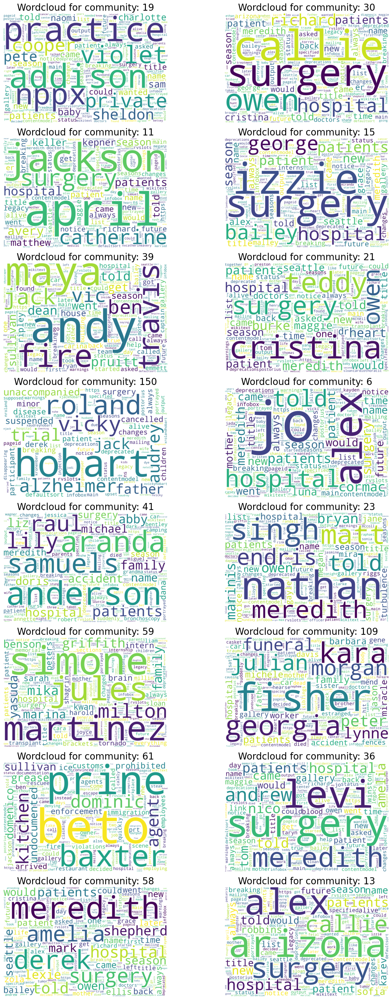

In [ ]:
# visualize tf-idf with wordclouds

plt.figure(figsize=[15,30])
j = 0
for i in data.head():
    j+=1
    plt.subplot(8, 2, j)
    create_wordcloud(str(i), "Wordcloud for community: "+str(i))
plt.tight_layout()

### 3.2.1 Community detection based on the louvain algorithm for only the Grey's Anatomy characters

To investigate if there is a difference in modularity and partitions, we applied the louvain algorithm also to the network consisting of Grey's Anatomy characters only.

In [ ]:
ga_net_pure_undirected = ga_net_pure.to_undirected()

bestPartition = community_louvain.best_partition(ga_net_pure_undirected)
bestPartition_dict = defaultdict(list)
for key, val in sorted(bestPartition.items()):
    bestPartition_dict[val].append(key)

bestPartition_com = []
bestPartition_sizes = {}
for i in bestPartition_dict:
    bestPartition_sizes[i] = len(bestPartition_dict[i])
    bestPartition_com += [bestPartition_dict[i]]

In [ ]:
# calculate modularity

mod = nx.algorithms.community.modularity(ga_net_pure_undirected, bestPartition_com)
print("Modularity only grey's anatomy: %f"%mod)

Modularity only grey's anatomy: 0.492119


In [ ]:
# get 16 largest communities

top_14 = sorted(bestPartition_sizes.items(), key=lambda kv : kv[1], reverse=True)[0:14]

In [ ]:
# deleting files before creating new ones
files = glob.glob("data/Communities/best_partition_pure/*")
for f in files:
    os.remove(f)

path = "data/character wikipages/"
newPath = "data/Communities/best_partition_pure"


# create files for each community
for i in bestPartition_dict:
    for j in top_10:
        if j[0] == i:
            with open(newPath+"/"+str(i)+'.json', 'a') as big_file:
                for file in bestPartition_dict[i]:
                    file = df[df["title"].isin([file])]["file"].tolist() 
                    f = open(path+file[0]+".json", 'r')
                    data = f.read()
                    data = re.sub(r'==.*?==+', '', data)
                    data = re.sub(r'[0-9]*', '', data)
                    big_file.write(data)
                    f.close()

In [ ]:
data = tfidf(newPath)

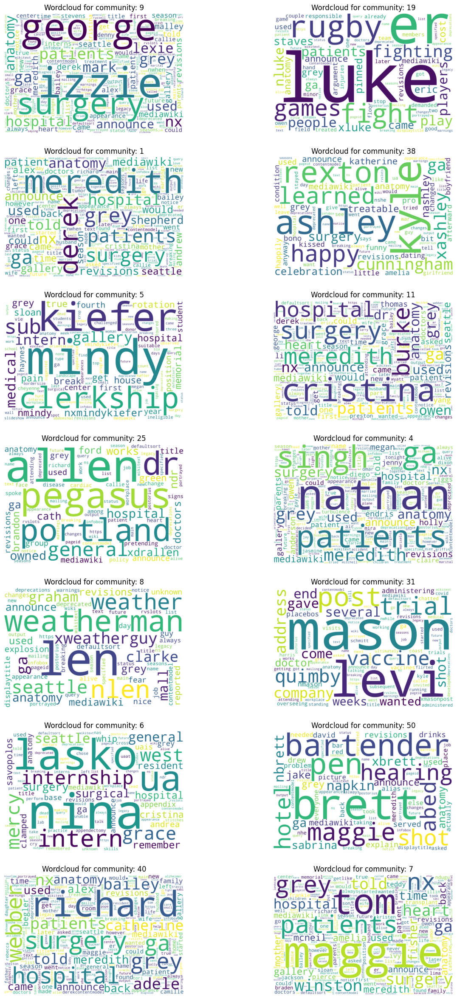

In [ ]:
# visualize tf-idf with wordclouds

plt.figure(figsize=[15,30])
j = 0
for i in data.head():
    j+=1
    plt.subplot(7, 2, j)
    create_wordcloud(str(i), "Wordcloud for community: "+str(i))
plt.tight_layout()

## 3.3 Community detection based on manual partitions into series and category

In [ ]:
# define categories

categories = df.category.unique()
print(categories)

['Patient' 'Other' 'Nurses' 'Doctor' 'Firefighter']


In [ ]:
# create partition based on category

categoryPartition = []

for i in categories:
    myStr = str(i).lower()
    myVars = globals()
    myVars[myStr] = df.loc[df['category'] == i]["title"].tolist()
    subset = [x for x in myVars[myStr] if ga_net_undirected.has_node(x)]
    categoryPartition += [subset]

In [ ]:
# calculate modularity

mod = nx.algorithms.community.modularity(ga_net_undirected, categoryPartition)
print("Modularity category division: %f"%mod)

Modularity category division: -0.055683


In [ ]:
# define universes

universes = df.main_universe.unique()

In [ ]:
# create partition based on universes

universePartition = []

for i in universes:
    myStr = str(i).lower()
    myVars = globals()
    myVars[myStr] = df.loc[df['main_universe'] == i]["title"].tolist()
    subset = [x for x in myVars[myStr] if ga_net_undirected.has_node(x)]
    universePartition += [subset]

In [ ]:
# calculate modularity

mod = nx.algorithms.community.modularity(ga_net_undirected, universePartition)
print("Modularity universe division: %f"%mod)

Modularity universe division: 0.334917


## 3.4 Community detection based on overlapping partitons with the percolation method

In [ ]:
overlappingPartition = list(k_clique_communities(ga_net_undirected, 5))
overlappingPartition_com = [list(x) for x in overlappingPartition]

In [ ]:
overlappingPartition_dict = {}

i = 0
for community in overlappingPartition_com:
    overlappingPartition_dict[i] = community
    i += 1

In [ ]:
overlappingPartition_sizes = {}
for i in overlappingPartition_dict:
    overlappingPartition_sizes[i] = len(overlappingPartition_dict[i])

In [ ]:
# get 14 largest communitites

top_14 = sorted(overlappingPartition_sizes.items(), key=lambda kv : kv[1], reverse=True)[0:14]

In [ ]:
# deleting files before creating new ones
files = glob.glob("data/Communities/overlapping_partition/*")
for f in files:
    os.remove(f)


# create files for each community
path = "data/character wikipages/"
newPath = "data/Communities/overlapping_partition"

for i in overlappingPartition_dict:
    for j in top_14:
        if j[0] == i:
            with open(newPath+"/"+str(i)+'.json', 'a') as big_file:
                for file in overlappingPartition_dict[i]:
                    file = df[df["title"].isin([file])]["file"].tolist() 
                    f = open(path+file[0]+".json", 'r')
                    data = f.read()
                    data = re.sub(r'==.*?==+', '', data)
                    data = re.sub(r'[0-9]*', '', data)
                    big_file.write(data)
                    f.close()

In [ ]:
data = tfidf(newPath)

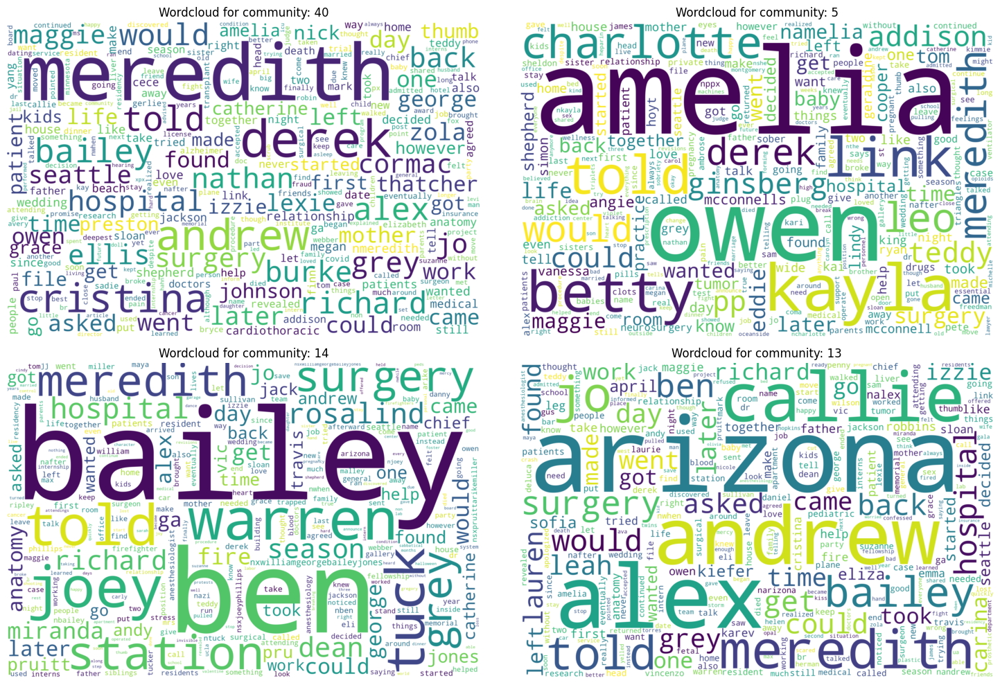

In [ ]:
# visualize tf-idf with wordclouds

plt.figure(figsize=[15,10])
j = 0
for i in [40,5, 14, 13]:
    j+=1
    plt.subplot(2, 2, j)
    create_wordcloud(str(i), "Wordcloud for community: "+str(i))
plt.tight_layout()

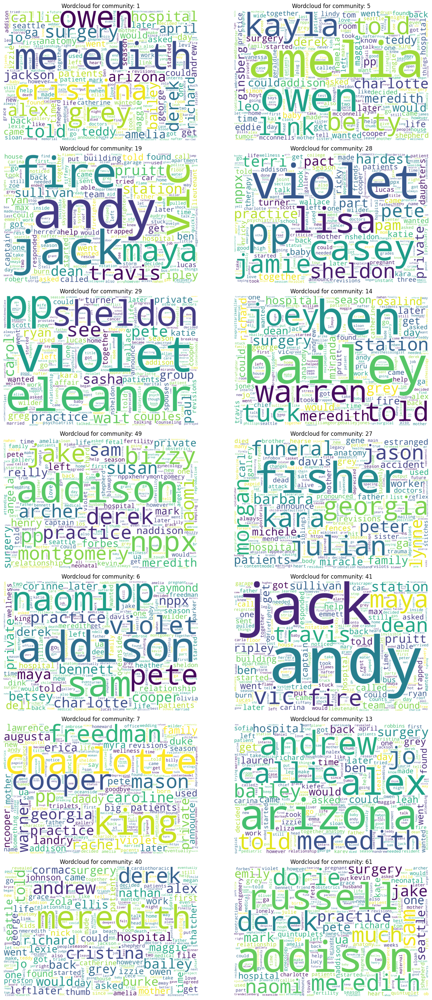

In [ ]:
# visualize tf-idf with wordclouds

plt.figure(figsize=[15,30])
j = 0
for i in data.head():
    j+=1
    plt.subplot(7, 2, j)
    create_wordcloud(str(i), "Wordcloud for community: "+str(i))
plt.tight_layout()

## 3.5 Main findings

- The best modularity could be found for the partitions with the Louvain algorithm. 
- A division into categories (Doctor, Nurse, Firefighter, Patient, Other) seems not be not reasonable since the modularity is negative. 
- The wordclouds show similiar results along the different methods of Louvian and overlapping partitions with the percolation method.
- The wordclouds focus mainly on romantic relationships, since these characters are often placed into the same community and the most mentioned in their partitions. 

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=6c50234c-0fc5-40eb-b0ef-2d1cda57d893' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>